<a href="https://colab.research.google.com/github/Keenandrea/content-preserving-text-generation-with-attribute-controls/blob/master/presentation2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

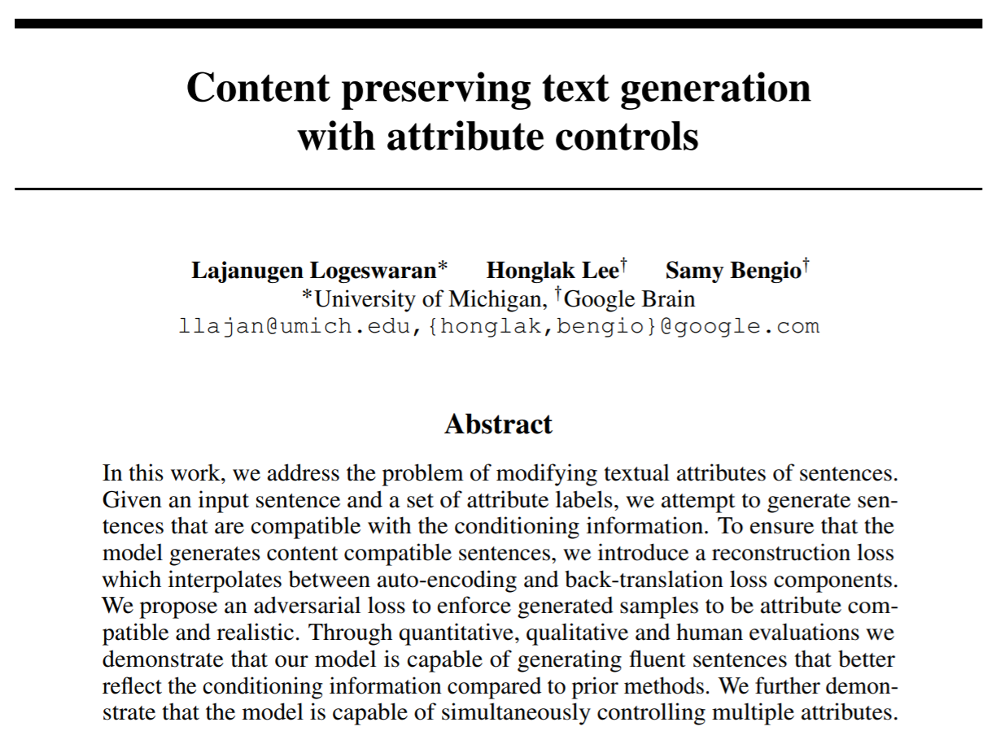

In [11]:
from IPython.display import Image
Image('title.PNG', width=900, height=670)

# Research Problem

---

The work attempts to generate sentences that are compatible with the conditioning information given an input sentence and a set of attribute labels. 

This is a step forward for NLP (Natural Language Processing), and text generation, as well as many other linguistically-oriented tasks like NMT (Neural Machine Translation).

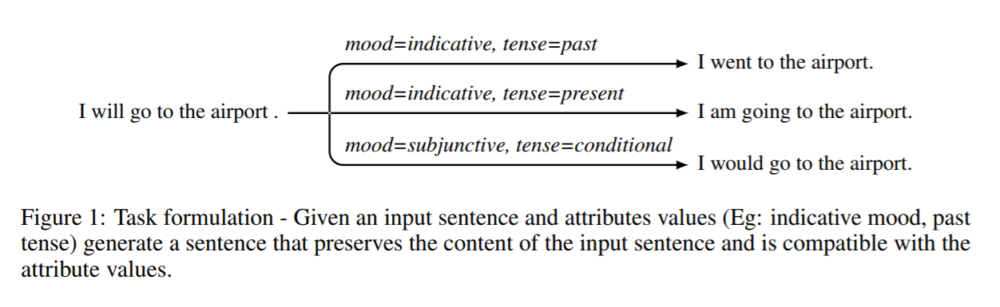

In [16]:
from IPython.display import Image
Image('task_formulation.PNG', width=900, height=315)

# Claimed Contributions

---

The work presented focuses on catagorical attributes of language. These are attributes such as sentiment, language complexity, tense, voice, honorifics, mood, and so on. 

## Content Preservation

---


The work enforces content preservation using auto-encoding and back-translation losses. Then an adversarial discriminator encourages attribute compatibility and realistic sequence generation. To be more data efficient, to scale better to multiple attributes with several classes with greater ease than prior methods, the adversarial discriminator is proposed.

## Previous Works

---


Previous works lasered in on assessing the attribute compatibility of generated sentences. But the authors claim the focus must be split between assessing the attribute compatibility of generated sentences and new metrics to objectively evaluate models for content preservation. By this token, vacuous mappings that simply generate a sentence of the desired attribute value while ignoring the content of the input sentence are penalized. 

## Control Over Multiple Attributes

---


In addition, the authors claim that the model is able to learn to control multiple attributes simultaneously. 

# Related Models

---

There are three related models:


1.   Conditional Text Generation
2.   Style Transfer
3.   Unsupervised Machine Translation

## Conditional Text Generative Models

---


Conditional text generation considered using LSTMs on Amazon reviews and discovered to learn a sentiment unit, which they clamp to a fixed value to generate label conditional paragraphs. Another generative model uses a VAE backbone, conditioned on a sentence and attribute labels, which attempts to express holistic sentence properties in its latent variable. The training of a VAE model is challenging because of the posterior collapse problem.

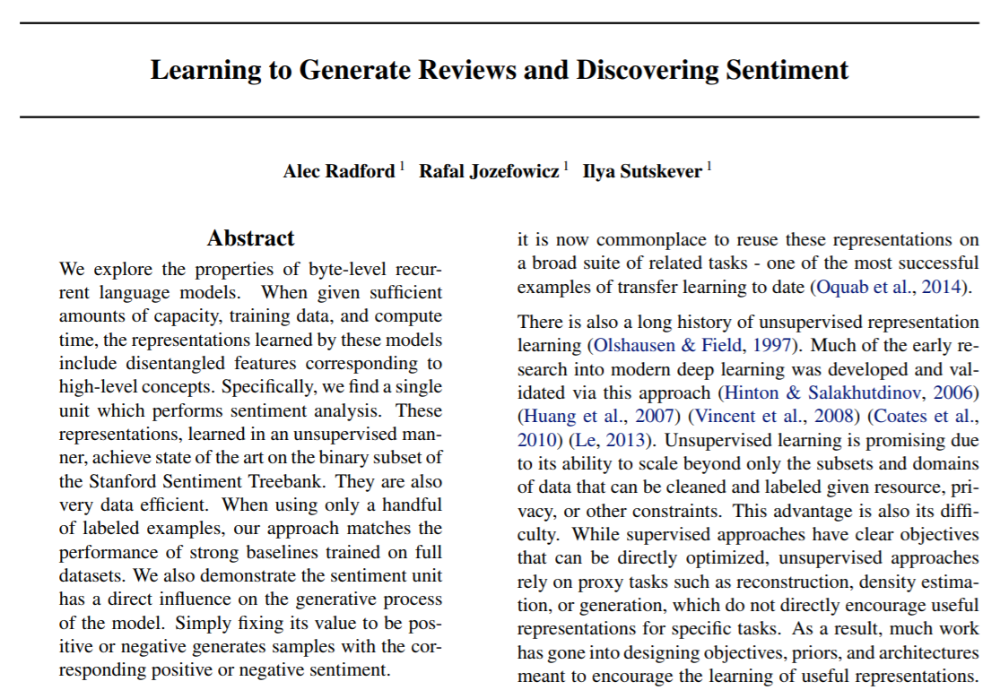

In [29]:
from IPython.display import Image
Image('radford.PNG', width=900, height=615)

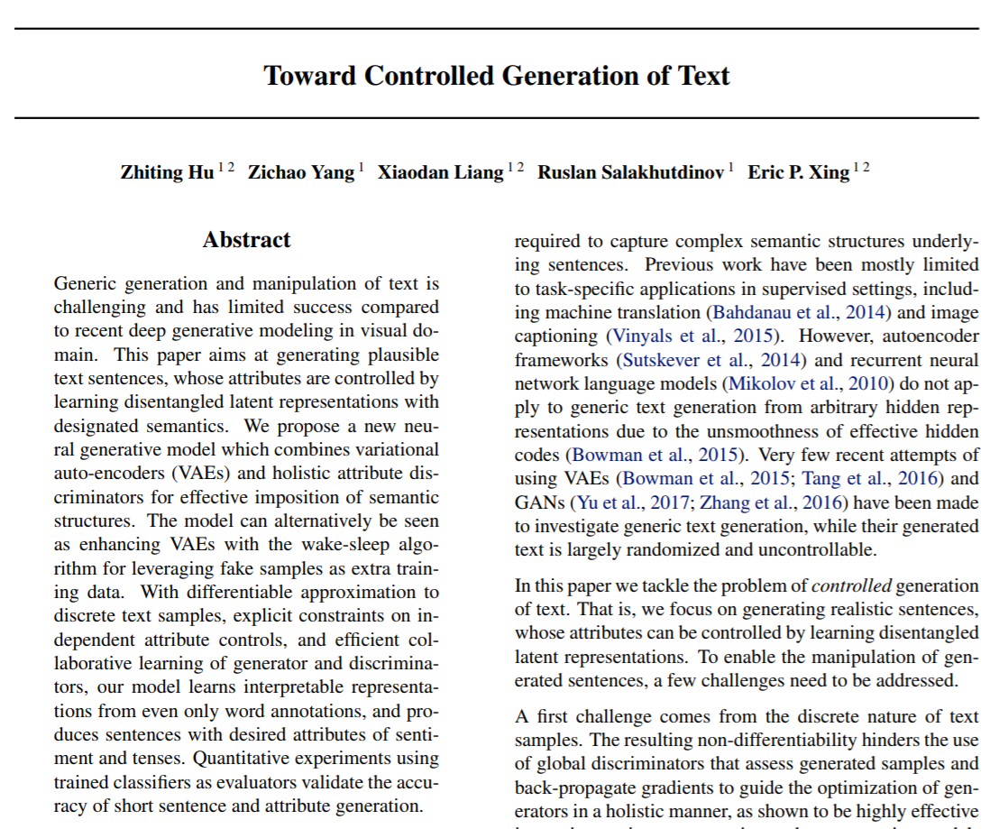

In [32]:
from IPython.display import Image
Image('zhiting.PNG', width=900, height=725)

## Style Transfer Models

---


Style transfer models have proposed that translating a sentence to a different language alters the stylistic properties of a sentence, a proposition approached by adopting an adversarial training approach. Our model proposes an adversarial loss that learns a single discriminator which determines whether a sentence is both realistic and compatible with a given set of attribute values.

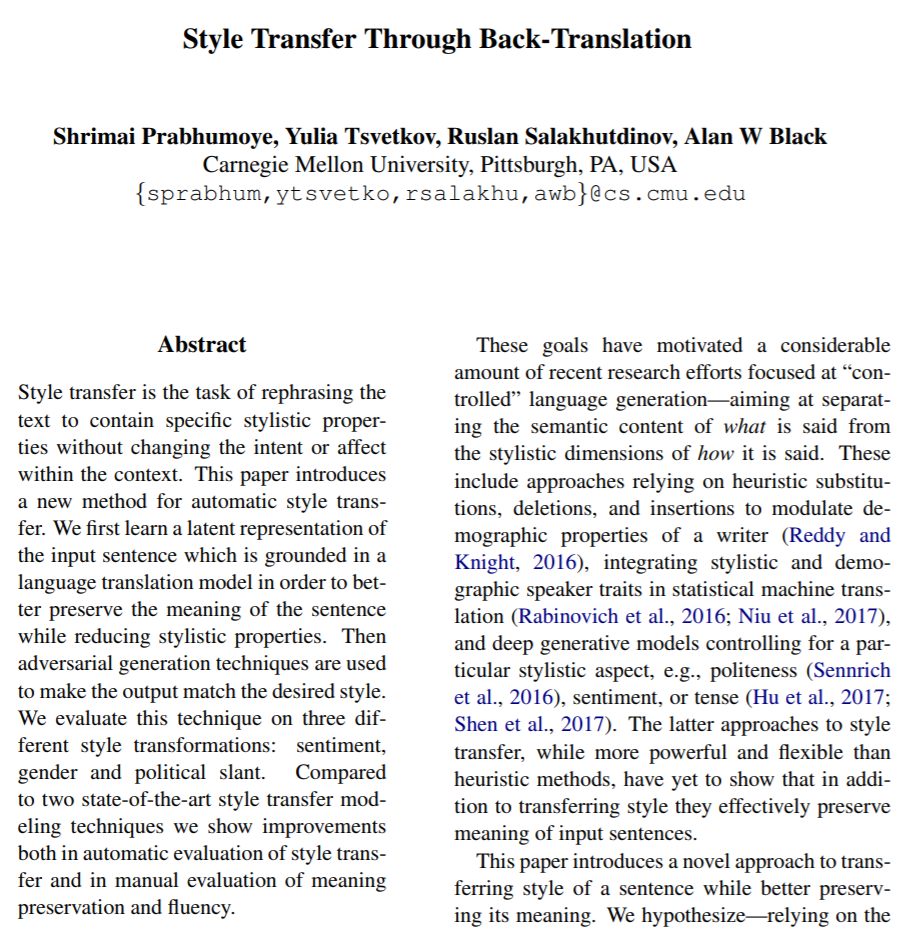

In [37]:
from IPython.display import Image
Image('style_transfer_1.PNG', width=900, height=875)

## Unsupervised Machine Translation Models

---


Unsupervised machine translation comes from a growing interest in discovering latent alignments between text from multiple languages using the idea of back-translation. One of these models is a seq2seq model with a shared encoder, trained using a de-noising auto-encoding objective and an iterative back-translation based training process. Our model uses a reconstruction loss which interpolates between these two losses to reduce the sensitivity of the model to these issues. 

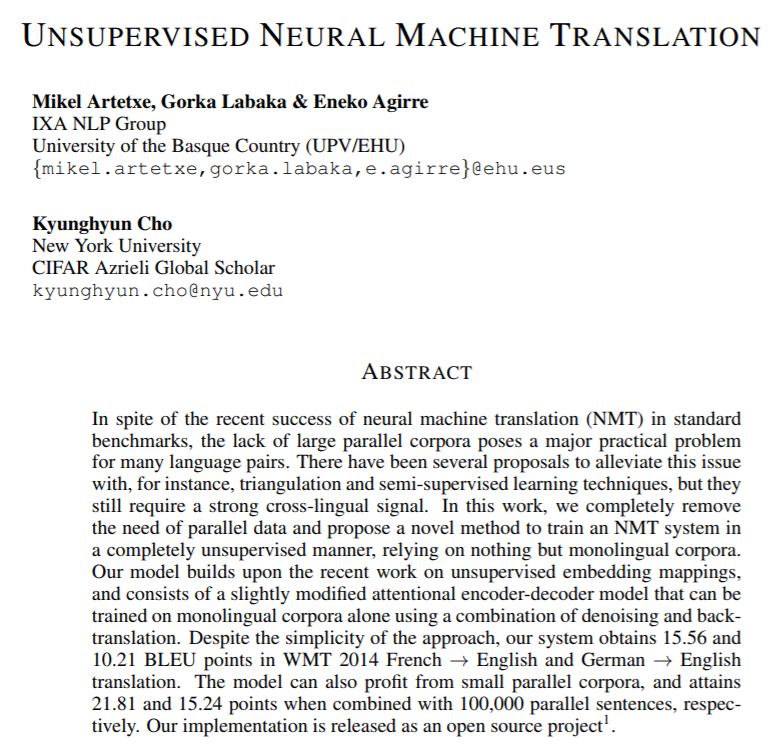

In [45]:
from IPython.display import Image
Image('unsupervised.PNG', width=900, height=825)

# Innovation

---

Two types of reconstruction losses encourage content compatibility: Autoencoding loss, and Back-translation loss. These two losses are fused by latent representations to innovate an Interpolated reconstruction loss. 

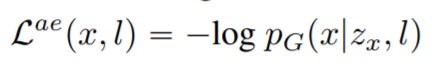

In [19]:
from IPython.display import Image
Image('autoencodingloss.PNG', width=900, height=150)

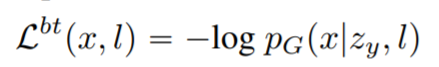

In [20]:
from IPython.display import Image
Image('backtranslationloss.PNG', width=900, height=150)

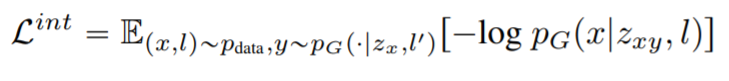

In [22]:
from IPython.display import Image
Image('interpolatedloss.PNG', width=900, height=100)

The interpolated content embedding makes it harder for the decoder to learn trivial solutions since it cannot rely on the original sentence alone to perform the reconstruction, and it also encourages content representations to be similar.

Furthermore, an adversarial loss is considered which encourages generating realistic and attribute compatible sentences. The adversarial loss tries to match the distribution of sentence and attribute vector pairs where the sentence can either be a real or generated sentence. 

The proposed discriminator models the joint distribution of realistic sentences and corresponding attribute labels. This approach is more data-efficient and exploits the correlation between different attributes as well as different attributes values.  

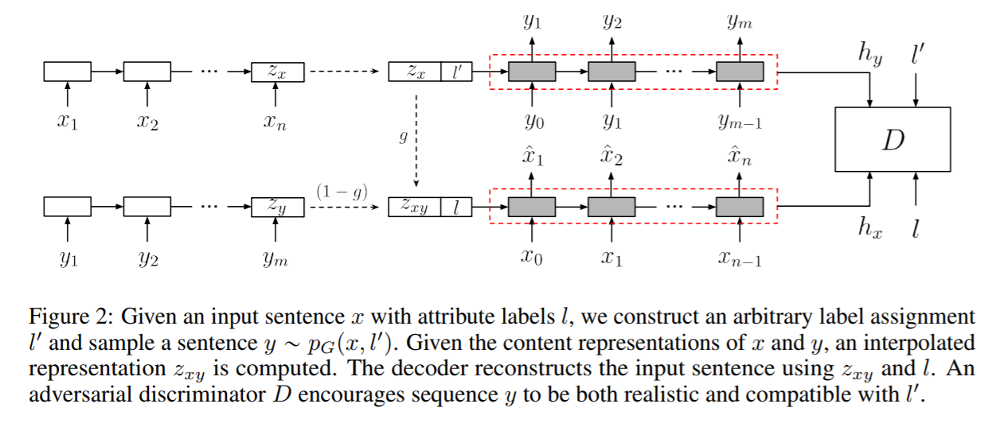

In [25]:
from IPython.display import Image
Image('discriminator.PNG', width=900, height=375)

# Prove It

---

The paper tackles after the sentiment attribute widely considered in previous work using these steps:


1.   Address the sentiment control task and compare comprehensively  against previous methods
2.   Perform quantitative, qualitative, and human evaluations to compare sentences generated by      different models
3.   Evaluate the model in a setting with available parallel data
4.   Consider controlling multiple attributes simultaneously

## Training

---

Autoencoding loss is used to measure how well the model generates content compatible sentences. Attribute compatibility is measured by generating sentences conditioned on a set of labels. Pre-trained attribute classifiers measure how well the samples match the labels. A GRU RNN with a hidden state size 500 is used as the encoder. Attribute labels are represented as a binary vector, and an attribute embedding is constructed via linear projection. The decoder is initialized using a concatenation of the representation coming from the encoder and the attribute embedding. Attribute embeddings of a size 200 and a decoder GRU with a hidden state size 700 were used. The discriminator recieves and RNN hidden state sequence and an attribute vector as input. The hidden state sequence is encoded using a bi-directional RNN with hidden state size 500. The interpolation probability and weight of the adversarial loss are chosen based on the validation metrics. Word embeddings are initialized with pre-trained GloVe embeddings.

## Metrics

---

To quantitatively evaluate how well the generated samples match the conditioning labels, the samples from the model are generated and measured by label accuracy using a pre-trained sentiment classifier. The classifiers achieve test accuracies of 95% and 90% on datasets. To measure content preservation the authors propose measure properties that would hold if the models did indeed produce content compatible sentences.

## Dataset

---

The restaurant reviews dataset is used first. It is a filtered version of the Yelp reviews dataset. Secondly, the IMDB movie review corpus is employed. A filtering process constructs a subset of the data for training and testing. The restaurant data set has 447k training sentences, and has 128k test sentences. The IMDB corpus has 300k training sentences and 36k test sentences.

## Worthy Opponents

---

The model is compared against Ctrl-gen, a VAE model, and Cross-align, the cross-alignment model. 



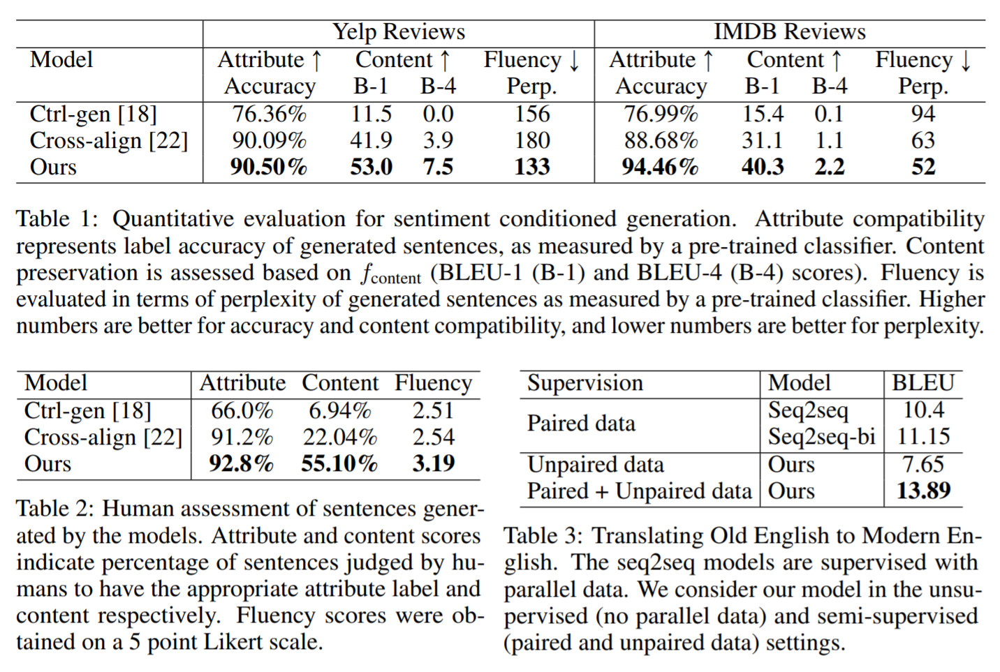

In [41]:
from IPython.display import Image
Image('dataset_one_tests.PNG', width=900, height=615)

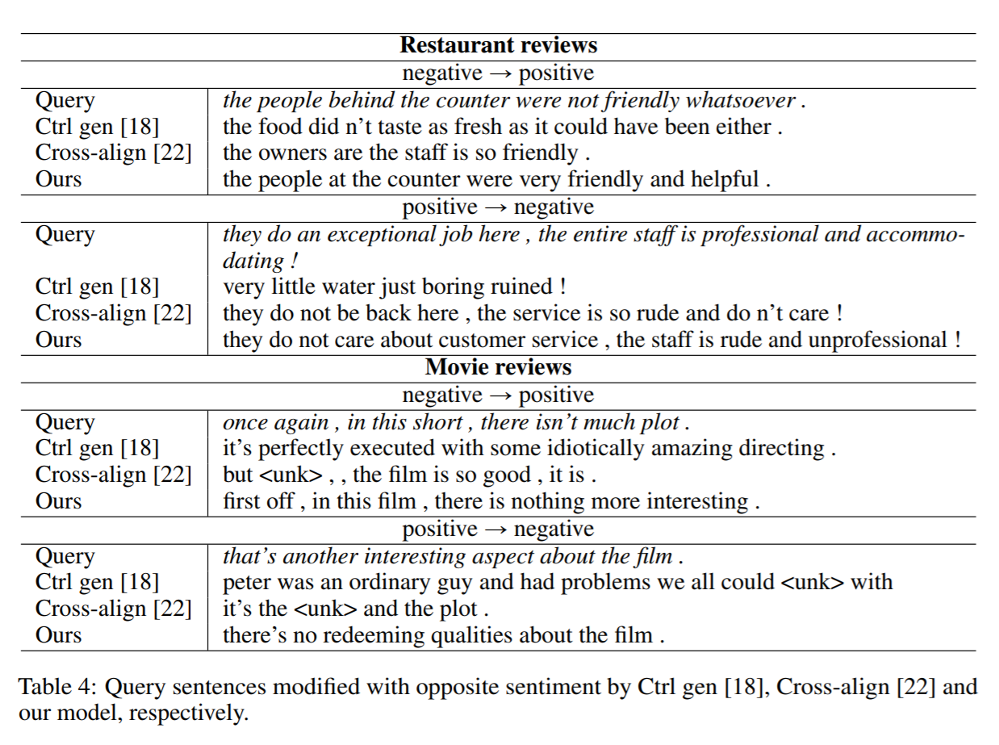

In [44]:
from IPython.display import Image
Image('dataset_two.PNG', width=900, height=650)

# Simultaneous Control of Multiple Attributes

---

Given a set of sentences annotated with multiple attributes, the goal is to be able to plug this data into the learning algorithm and obtain a model capable of tweaking these properties of a sentence. The attributes under consideration are tense, voice, mood, and negation. 

A subset of two-million sentences from the BookCorpus dataset were chosen to have approximately near class balance across different attributes. The table below shows generated sentences conditioned on all valid combinations of attribute values for a given query sentence. An annotation tool is used to assess attribute compatibility of generated sentences. 

Attribute accuracies measured on generated sentences for mood, tence, voice, and negation were: 98%, 98%, 90%, and 97%, in that order. The downside of the expirement is that the model tends to distort the content during voice control.  

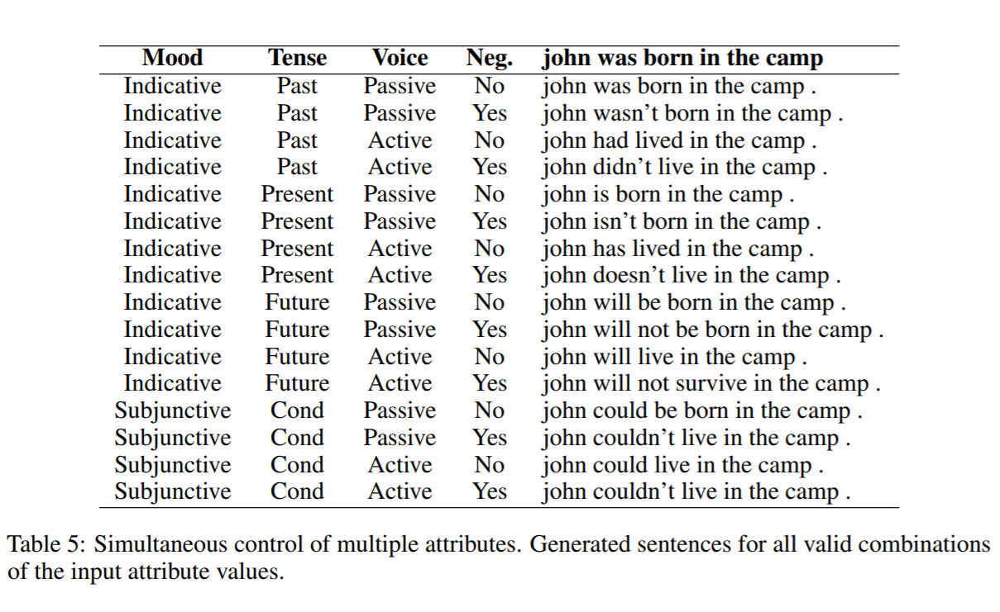

In [5]:
from IPython.display import Image
Image('text_emulation.PNG', width=900, height=575)

# Conclusion

---

There are a few lessons to be learned from the paper. Most of all: it is the discrete nature of language that makes text generation challenging. Language attributes have a wide variety of labels, first you've got your nouns, pronouns, verbs, and adjectives, each of which has it's own subclasses, and then you have your prepositions, conjunctions, possessives, and so on, not to mention to trickiness of idiomatic expressions and collocations. 

But the work presented here is promising. The model's presentation of simultaneous control of multiple attributes can be improved and expanded to include the full-range of grammars. While previous work has been centered around controlling a single attribute and transferring between two styles, the proposed model easily extends to the multiple attribute scenario. The new baseline has been set. From here, perhaps a much larger set of semantic and syntactic attributes is near at hand.  

# Thank You For Listening

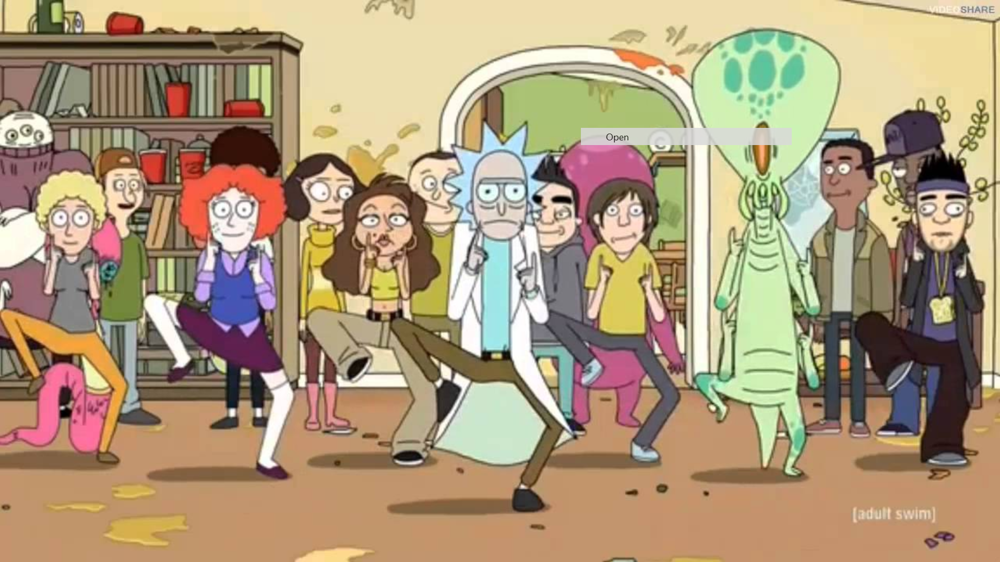

In [47]:
from IPython.display import Image
Image('thanks.PNG', width=900, height=515)